<a href="https://colab.research.google.com/github/meetrafay/CNN-weather-classification/blob/main/DL_Assignment_02.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# CNN for Weather Classification

In [ ]:
# imports neccessary packages and libraries

import os
import cv2
import numpy as np
import seaborn as sns
import tensorflow as tf
from numpy import argmax
import matplotlib.pyplot as plt
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import MobileNetV2
from kears.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import load_model, Model, Sequential
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Input, Dropout, BatchNormalization, GlobalAveragePooling2D

## Section 1: Dataset Loading and Visualization

1.  Load the weather dataset from the directory. Ensure all 11 classes are recognized.
2.  Display 2–3 random images from each class using `matplotlib`.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
dew1 = cv2.imread('/content/drive/MyDrive/DATA SETS/extracted_data/dataset/dew/2208.jpg')
dew2 = cv2.imread('/content/drive/MyDrive/DATA SETS/extracted_data/dataset/dew/2209.jpg')
dew3 = cv2.imread('/content/drive/MyDrive/DATA SETS/extracted_data/dataset/dew/2211.jpg')

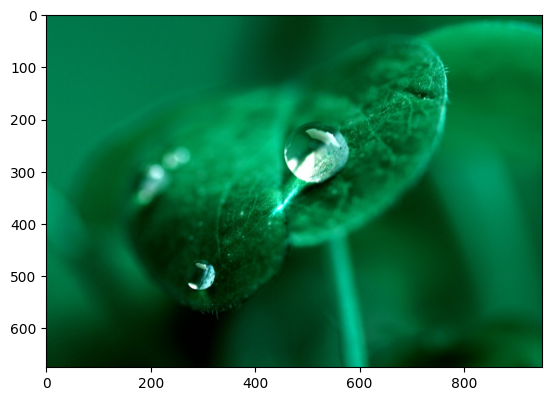

In [ ]:
plt.imshow(dew1)

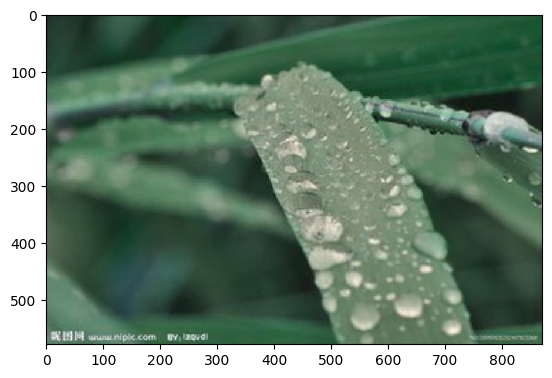

In [ ]:
plt.imshow(dew2)

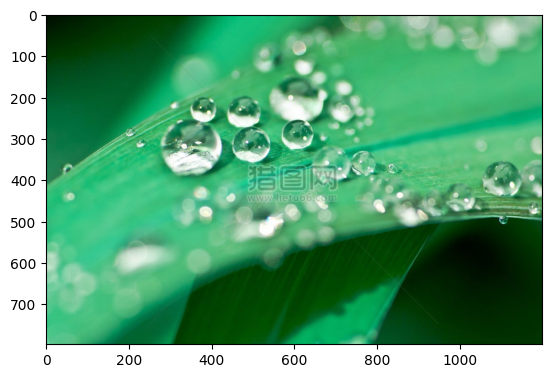

In [ ]:
plt.imshow(dew3)


In [ ]:
fog1 = cv2.imread('/content/drive/MyDrive/DATA SETS/extracted_data/dataset/fogsmog/4075.jpg')
fog2 = cv2.imread('/content/drive/MyDrive/DATA SETS/extracted_data/dataset/fogsmog/4077.jpg')
fog3 = cv2.imread('/content/drive/MyDrive/DATA SETS/extracted_data/dataset/fogsmog/4076.jpg')


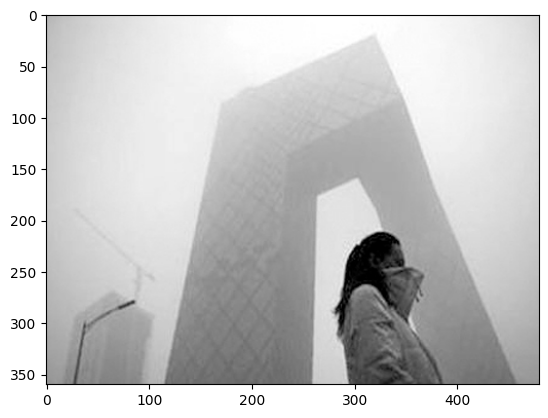

In [ ]:
plt.imshow(fog1)

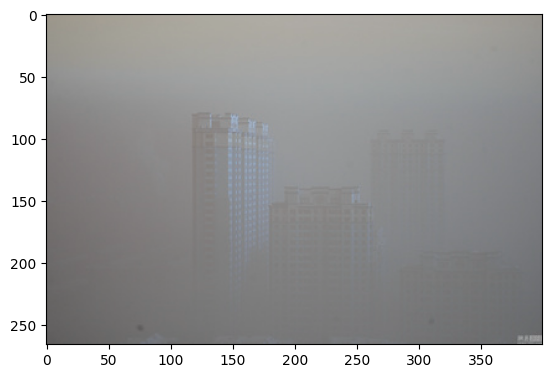

In [ ]:
plt.imshow(fog2)

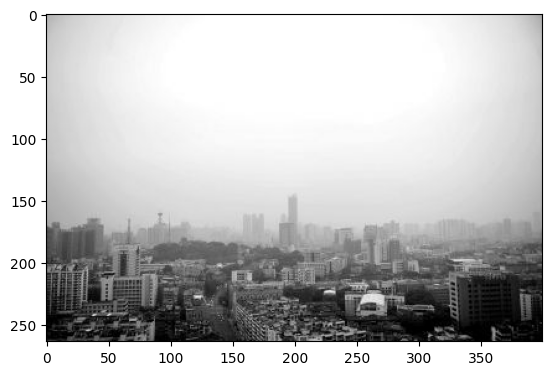

In [ ]:
plt.imshow(fog3)

In [ ]:
frost1 = cv2.imread('/content/drive/MyDrive/DATA SETS/extracted_data/dataset/frost/3600.jpg')
frost2 = cv2.imread('/content/drive/MyDrive/DATA SETS/extracted_data/dataset/frost/3601.jpg')
frost3 = cv2.imread('/content/drive/MyDrive/DATA SETS/extracted_data/dataset/frost/3602.jpg')


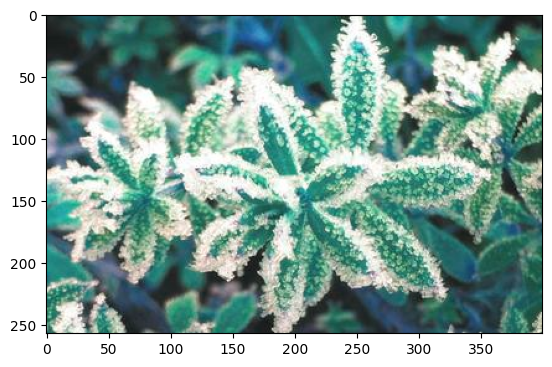

In [ ]:
plt.imshow(frost1)

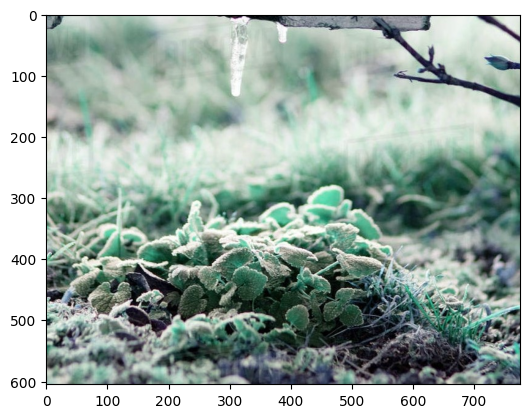

In [ ]:
plt.imshow(frost2)

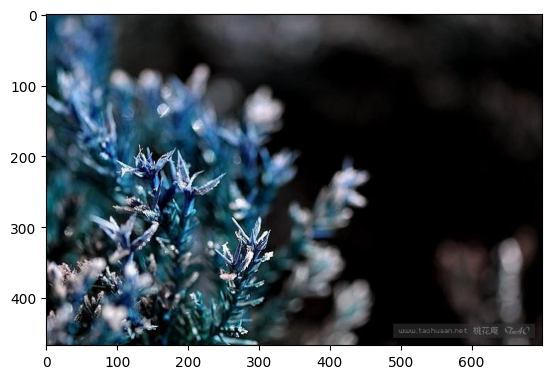

In [ ]:
plt.imshow(frost3)

In [ ]:
glaze1 = cv2.imread('/content/drive/MyDrive/DATA SETS/extracted_data/dataset/glaze/6090.jpg')
glaze2 = cv2.imread('/content/drive/MyDrive/DATA SETS/extracted_data/dataset/glaze/6091.jpg')
glaze3 = cv2.imread('/content/drive/MyDrive/DATA SETS/extracted_data/dataset/glaze/6092.jpg')


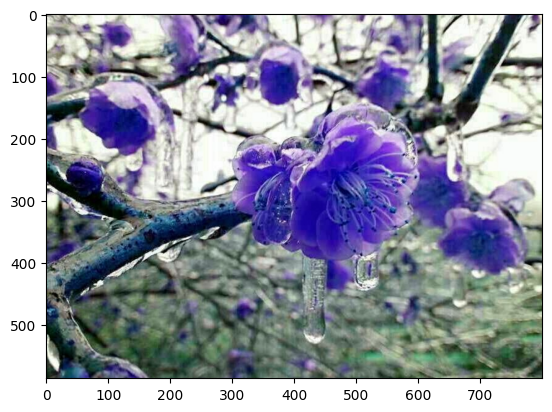

In [ ]:
plt.imshow(glaze1)

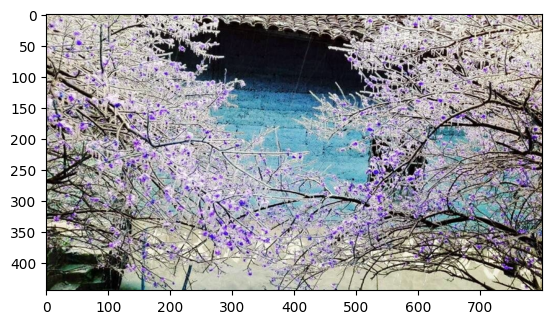

In [ ]:
plt.imshow(glaze2)

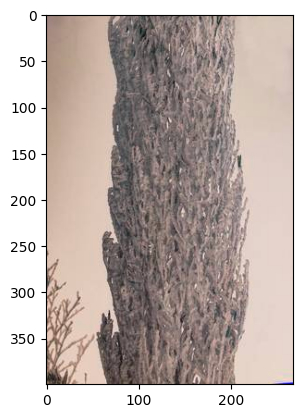

In [ ]:
plt.imshow(glaze3)

In [ ]:
hail1 = cv2.imread('/content/drive/MyDrive/DATA SETS/extracted_data/dataset/hail/0000.jpg')
hail2 = cv2.imread('/content/drive/MyDrive/DATA SETS/extracted_data/dataset/hail/0001.jpg')
hail3 = cv2.imread('/content/drive/MyDrive/DATA SETS/extracted_data/dataset/hail/0002.jpg')

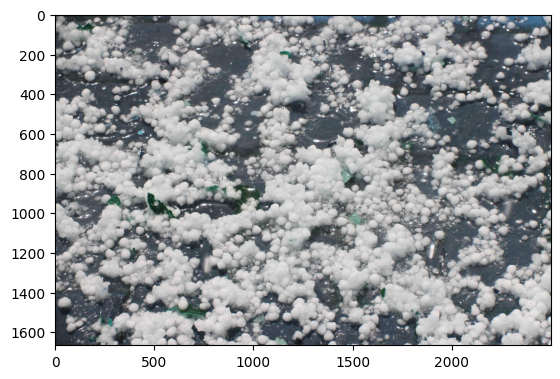

In [ ]:
plt.imshow(hail1)

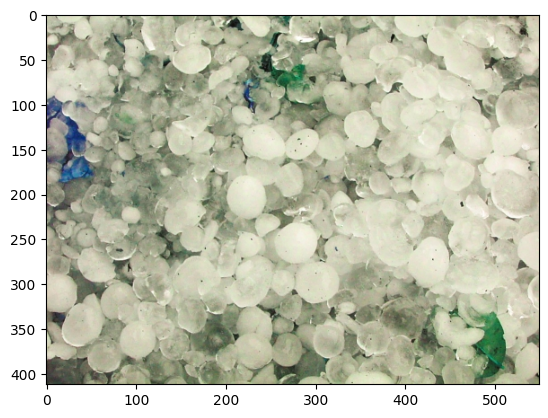

In [ ]:
plt.imshow(hail2)

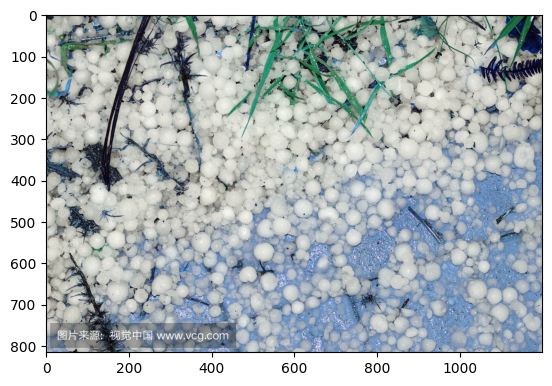

In [ ]:
plt.imshow(hail3)

In [ ]:
lightning1 = cv2.imread('/content/drive/MyDrive/DATA SETS/extracted_data/dataset/lightning/1830.jpg')
lightning2 = cv2.imread('/content/drive/MyDrive/DATA SETS/extracted_data/dataset/lightning/1831.jpg')
lightning3 = cv2.imread('/content/drive/MyDrive/DATA SETS/extracted_data/dataset/lightning/1832.jpg')


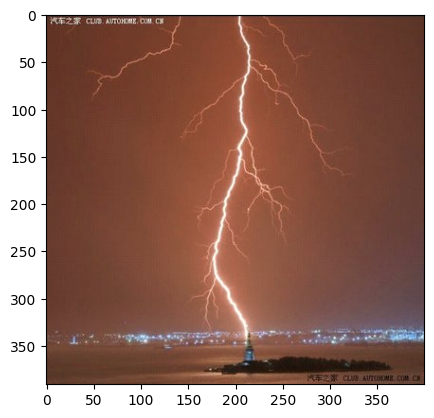

In [ ]:
plt.imshow(lightning1)

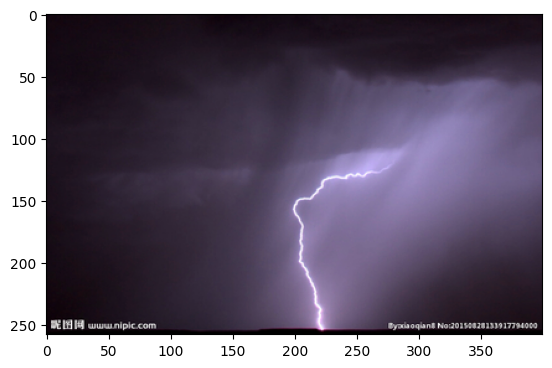

In [ ]:
plt.imshow(lightning2)

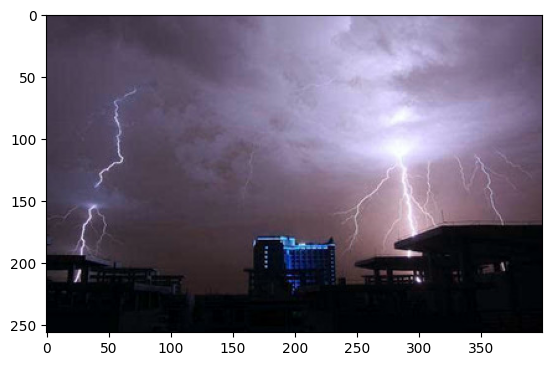

In [ ]:
plt.imshow(lightning3)

In [ ]:
rain1 = cv2.imread('/content/drive/MyDrive/DATA SETS/extracted_data/dataset/rain/11.jpg')
rain2 = cv2.imread('/content/drive/MyDrive/DATA SETS/extracted_data/dataset/rain/14.jpg')
rain3 = cv2.imread('/content/drive/MyDrive/DATA SETS/extracted_data/dataset/rain/13.jpg')


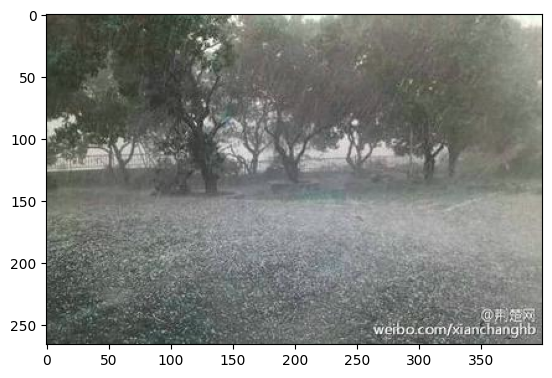

In [ ]:
plt.imshow(rain1)

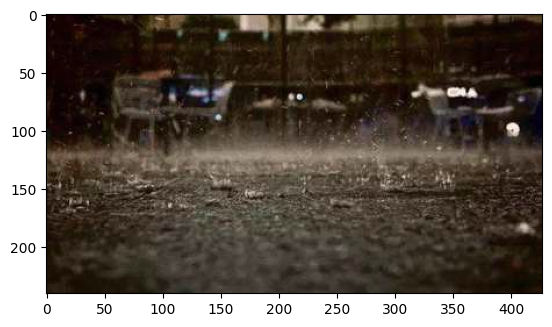

In [ ]:
plt.imshow(rain2)

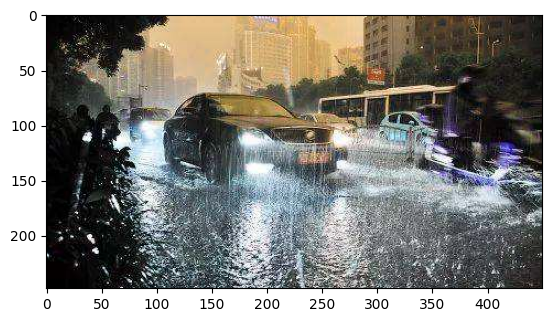

In [ ]:
plt.imshow(rain3)

In [ ]:
rainbow1 = cv2.imread('/content/drive/MyDrive/DATA SETS/extracted_data/dataset/rainbow/0592.jpg')
rainbow2 = cv2.imread('/content/drive/MyDrive/DATA SETS/extracted_data/dataset/rainbow/0593.jpg')
rainbow3 = cv2.imread('/content/drive/MyDrive/DATA SETS/extracted_data/dataset/rainbow/0594.jpg')


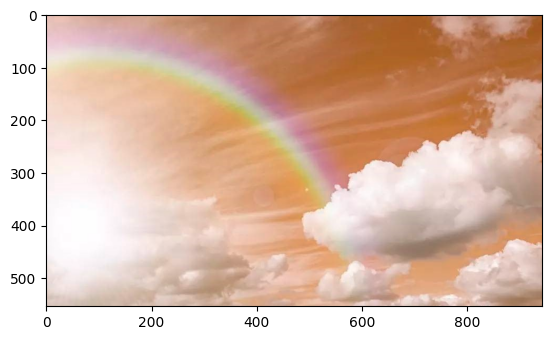

In [ ]:
plt.imshow(rainbow1)

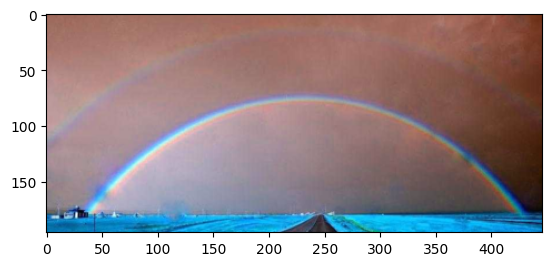

In [ ]:
plt.imshow(rainbow2)

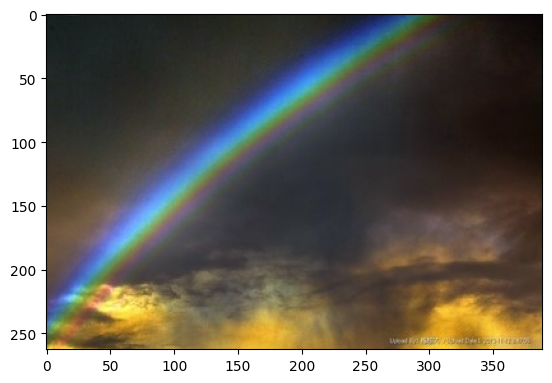

In [ ]:
plt.imshow(rainbow3)

In [ ]:
rime1 = cv2.imread('/content/drive/MyDrive/DATA SETS/extracted_data/dataset/rime/4930.jpg')
rime2 = cv2.imread('/content/drive/MyDrive/DATA SETS/extracted_data/dataset/rime/4931.jpg')
rime3 = cv2.imread('/content/drive/MyDrive/DATA SETS/extracted_data/dataset/rime/4932.jpg')


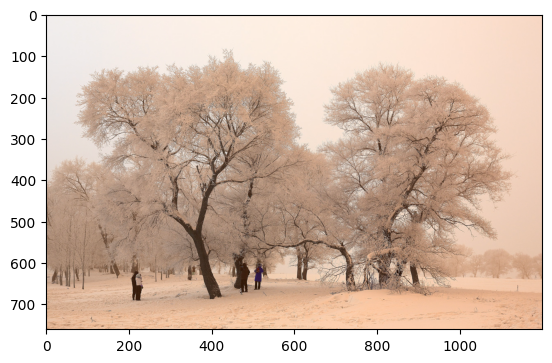

In [ ]:
plt.imshow(rime1)

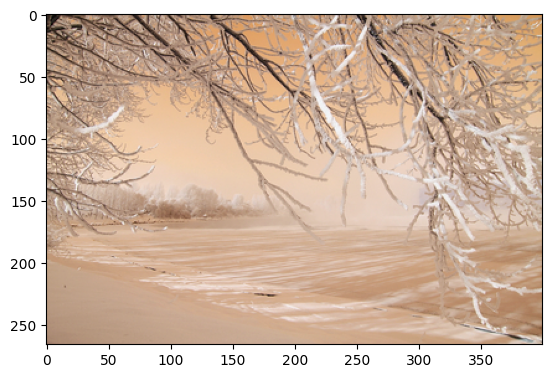

In [ ]:
plt.imshow(rime2)

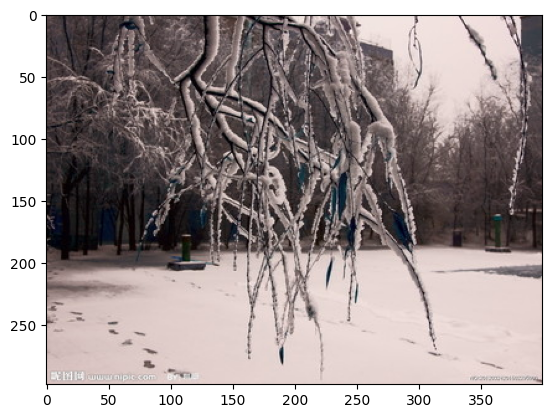

In [ ]:
plt.imshow(rime3)

In [ ]:
sandstorm1 = cv2.imread('/content/drive/MyDrive/DATA SETS/extracted_data/dataset/sandstorm/2908.jpg')
sandstorm2 = cv2.imread('/content/drive/MyDrive/DATA SETS/extracted_data/dataset/sandstorm/2909.jpg')
sandstorm3 = cv2.imread('/content/drive/MyDrive/DATA SETS/extracted_data/dataset/sandstorm/2910.jpg')


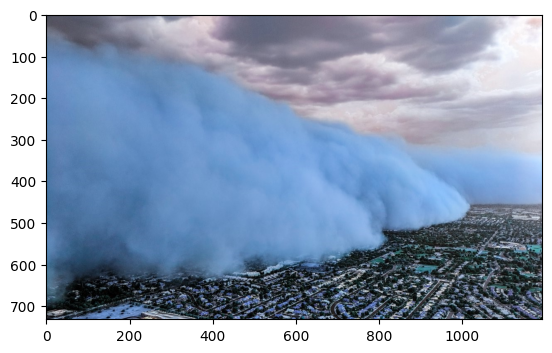

In [ ]:
plt.imshow(sandstorm1)

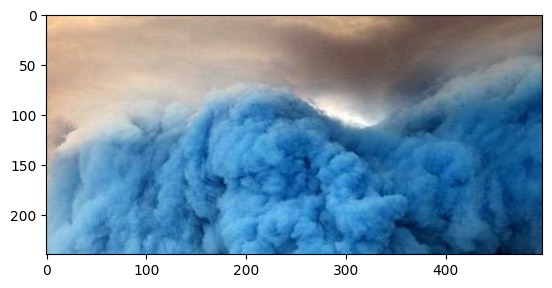

In [ ]:
plt.imshow(sandstorm2)

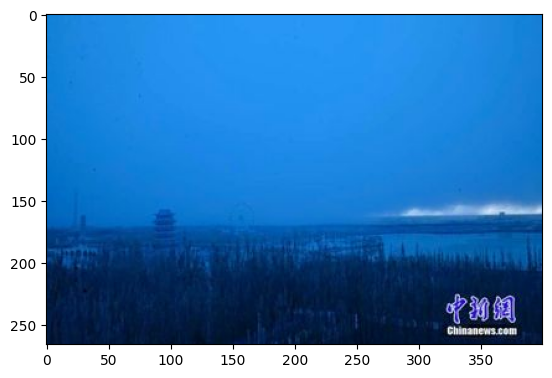

In [ ]:
plt.imshow(sandstorm3)

In [ ]:
snow1 = cv2.imread('/content/drive/MyDrive/DATA SETS/extracted_data/dataset/snow/0830.jpg')
snow2 = cv2.imread('/content/drive/MyDrive/DATA SETS/extracted_data/dataset/snow/0831.jpg')
snow3 = cv2.imread('/content/drive/MyDrive/DATA SETS/extracted_data/dataset/snow/0832.jpg')


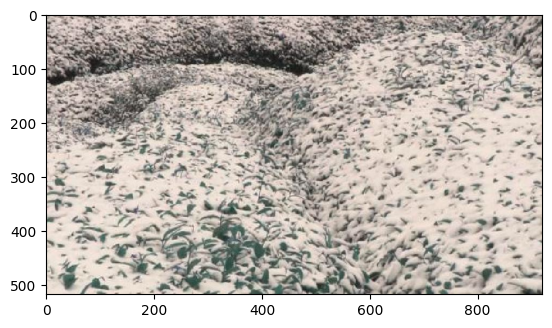

In [ ]:
plt.imshow(snow1)

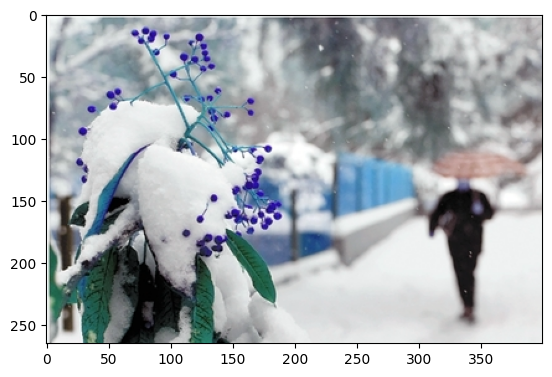

In [ ]:
plt.imshow(snow2)

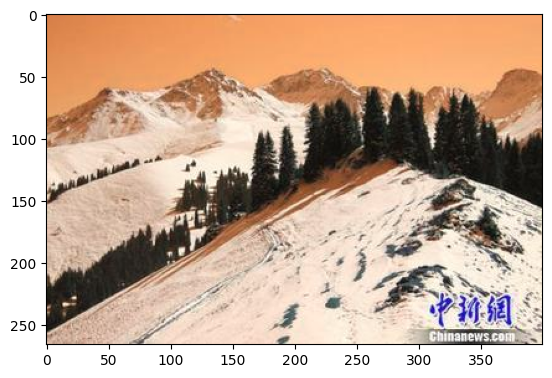

In [ ]:
plt.imshow(snow3)

## Section 2: Data Preprocessing

1.  Resize all images to a uniform shape (e.g., 150x150 or 224x224).
2.  Normalize pixel values to the range `[0, 1]`.
3.  Split the dataset into training, validation, and test sets.
4.  Apply data augmentation using transformations like rotation, flipping, zoom, and brightness adjustment.

In [ ]:
snow1.shape

(518, 920, 3)

In [ ]:
fog1.shape

(360, 480, 3)

In [ ]:
# apply data augmentation and create data generator

IMG_SIZE = (224, 224)
BATCH_SIZE = 32

DATA_DIR = '/content/drive/MyDrive/DATA SETS/weather_dataset_split'

train_dir = os.path.join(DATA_DIR, 'train')
val_dir   = os.path.join(DATA_DIR, 'val')
test_dir  = os.path.join(DATA_DIR, 'test')

train_datagen = ImageDataGenerator(
    rescale=1./255,             # normalize pixels to [0,1]
    rotation_range=30,          # rotate images up to 30°
    zoom_range=0.2,             # zoom in/out by 20%
    horizontal_flip=True,       # flip images horizontally
    brightness_range=[0.7, 1.3] # randomly darken/brighten
)


val_test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

val_generator = val_test_datagen.flow_from_directory(
    val_dir,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

test_generator = val_test_datagen.flow_from_directory(
    test_dir,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

Found 4797 images belonging to 11 classes.
Found 1022 images belonging to 11 classes.
Found 1041 images belonging to 11 classes.


## Section 3: Model Building

1.  Build a CNN model with at least:
    * `Conv2D` with 32 filters, `kernel_size=(3,3)`, `activation='relu'`
    * `MaxPooling2D`
    * `Conv2D` with 64 filters
    * `MaxPooling2D`
    * `Flatten`
    * `Dense` with 128 neurons and `'relu'` activation
    * `Dense` output layer with 11 neurons and `'softmax'` activation

In [ ]:
# build first CNN model

model = Sequential()

# 1st Conv + Pool
model.add(Conv2D(filters=32, kernel_size=(3, 3), activation='relu', input_shape=(224, 224, 3)))
model.add(MaxPooling2D(pool_size=(2, 2)))

# 2nd Conv + Pool
model.add(Conv2D(filters=64, kernel_size=(3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

# Flatten + Dense
model.add(Flatten())
model.add(Dense(units=128, activation='relu'))
model.add(Dropout(0.5))

# Output layer (11 classes)
model.add(Dense(units=11, activation='softmax'))

In [ ]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_2 (Conv2D)               │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 186624)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │    23,888,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 11)             │         1,419 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,908,811 (91.20 MB)

 Trainable params: 23,908,811 (91.20 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# train model on training dataset
history = model.fit(train_generator, epochs=10, validation_data=val_generator)

Epoch 1/10
150/150 ━━━━━━━━━━━━━━━━━━━━ 570s 4s/step - accuracy: 0.3142 - loss: 3.0808 - val_accuracy: 0.5548 - val_loss: 1.3873
Epoch 2/10
150/150 ━━━━━━━━━━━━━━━━━━━━ 556s 4s/step - accuracy: 0.5139 - loss: 1.4930 - val_accuracy: 0.6115 - val_loss: 1.1261
Epoch 3/10
150/150 ━━━━━━━━━━━━━━━━━━━━ 558s 4s/step - accuracy: 0.5375 - loss: 1.4203 - val_accuracy: 0.6458 - val_loss: 1.0339
Epoch 4/10
150/150 ━━━━━━━━━━━━━━━━━━━━ 560s 4s/step - accuracy: 0.5885 - loss: 1.2662 - val_accuracy: 0.6282 - val_loss: 1.0810
Epoch 5/10
150/150 ━━━━━━━━━━━━━━━━━━━━ 556s 4s/step - accuracy: 0.5989 - loss: 1.2163 - val_accuracy: 0.6517 - val_loss: 1.0763
Epoch 6/10
150/150 ━━━━━━━━━━━━━━━━━━━━ 560s 4s/step - accuracy: 0.6257 - loss: 1.1440 - val_accuracy: 0.6644 - val_loss: 1.0086
Epoch 7/10
150/150 ━━━━━━━━━━━━━━━━━━━━ 550s 4s/step - accuracy: 0.6075 - loss: 1.1742 - val_accuracy: 0.6566 - val_loss: 0.9893
Epoch 8/10
150/150 ━━━━━━━━━━━━━━━━━━━━ 551s 4s/step - accuracy: 0.6352 - loss: 1.1088 - val_accu

2.  Compile the model using:
    * **Loss:** `'categorical_crossentropy'`
    * **Optimizer:** Adam or RMSprop
    * **Metrics:** `['accuracy']`


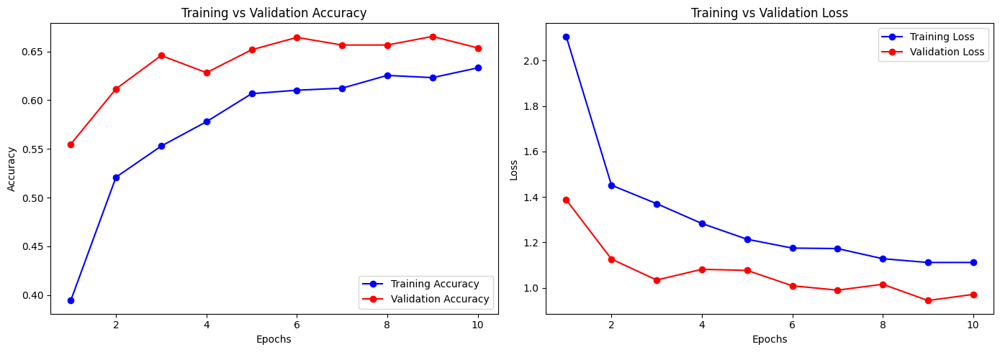

In [ ]:
# Get metrics from history
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

# Accuracy plot
plt.figure(figsize=(14, 5))
plt.subplot(1, 2, 1)
plt.plot(epochs, acc, 'bo-', label='Training Accuracy')
plt.plot(epochs, val_acc, 'ro-', label='Validation Accuracy')
plt.title('Training vs Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(epochs, loss, 'bo-', label='Training Loss')
plt.plot(epochs, val_loss, 'ro-', label='Validation Loss')
plt.title('Training vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()


In [ ]:
# save model
model.save('/content/drive/MyDrive/DATA SETS/Models/my_weather_model.keras')

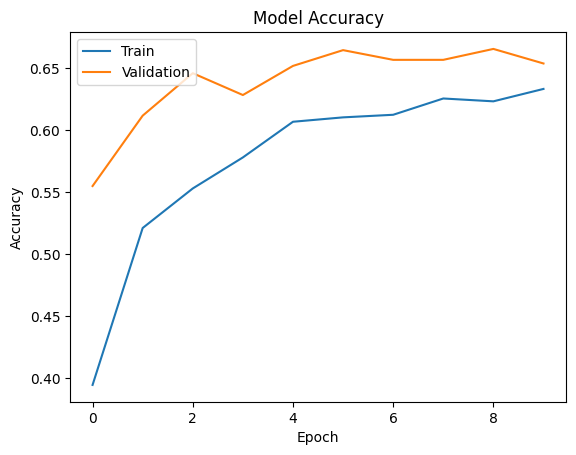

In [ ]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

In [ ]:
# load model
model = load_model('/content/drive/MyDrive/DATA SETS/Models/my_weather_model.keras')

## Section 4: Training and Evaluation

1.  Train the model using the training set. Use validation data to monitor performance. Choose appropriate batch size and epochs.
2.  Plot training and validation accuracy and loss over epochs.
3.  Evaluate the model on the test set and print:
    * Accuracy
    * Classification report (precision, recall, f1-score)
    * Confusion matrix
4.  Display some misclassified images with their predicted vs actual labels.

In [ ]:
# evaluate model on test dataset
test_loss, teat_accuracy = model.evaluate(test_generator)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


33/33 ━━━━━━━━━━━━━━━━━━━━ 213s 6s/step - accuracy: 0.6509 - loss: 1.0117


In [ ]:
print(f'Test Loss: {test_loss:.4f}')
print(f'Test Accuracy: {teat_accuracy:.4f}')

Test Loss: 0.9720
Test Accuracy: 0.6561


In [ ]:
y_pred_probs = model.predict(test_generator)

33/33 ━━━━━━━━━━━━━━━━━━━━ 32s 941ms/step


In [ ]:
y_pred = np.argmax(y_pred_probs, axis=1)

In [ ]:
y_pred

array([3, 8, 5, ..., 1, 7, 6])

In [ ]:
y_true = test_generator.classes

In [ ]:
accuracy = accuracy_score(y_true, y_pred)

In [ ]:
accuracy

0.10470701248799232

In [ ]:
class_labels = list(test_generator.class_indices.keys())

In [ ]:
class_labels

['dew',
 'fogsmog',
 'frost',
 'glaze',
 'hail',
 'lightning',
 'rain',
 'rainbow',
 'rime',
 'sandstorm',
 'snow']

In [ ]:
# display classification report

print("\nClassification Report:")
print(classification_report(y_true, y_pred, target_names=class_labels))


Classification Report:
              precision    recall  f1-score   support

         dew       0.08      0.07      0.07       106
     fogsmog       0.10      0.09      0.10       129
       frost       0.07      0.04      0.05        72
       glaze       0.12      0.27      0.17        97
        hail       0.10      0.08      0.09        90
   lightning       0.04      0.03      0.04        58
        rain       0.02      0.01      0.01        80
     rainbow       0.10      0.06      0.07        36
        rime       0.17      0.20      0.18       174
   sandstorm       0.08      0.09      0.09       105
        snow       0.07      0.06      0.07        94

    accuracy                           0.10      1041
   macro avg       0.09      0.09      0.09      1041
weighted avg       0.10      0.10      0.10      1041



In [ ]:
# display confusion matrix
cm = confusion_matrix(y_true, y_pred)
print(cm)

[[ 7 13  4 26  4  7  4  1 22 11  7]
 [14 12  6 29  8  3  7  2 26 15  7]
 [ 7 11  3 13  3  4  6  0 12  7  6]
 [14  8  3 26  5  5  4  2 18  5  7]
 [ 4  8  4 13  7  6  7  2 20 11  8]
 [ 6  6  4  7  3  2  2  2 10  6 10]
 [10 10  3 10  5  7  1  1 12 12  9]
 [ 3  3  0 14  3  3  2  2  5  0  1]
 [13 17  4 43 18  1 11  3 34 18 12]
 [12 14  5 12 10  7  8  2 19  9  7]
 [ 3 14  8 17  4  8  2  3 17 12  6]]


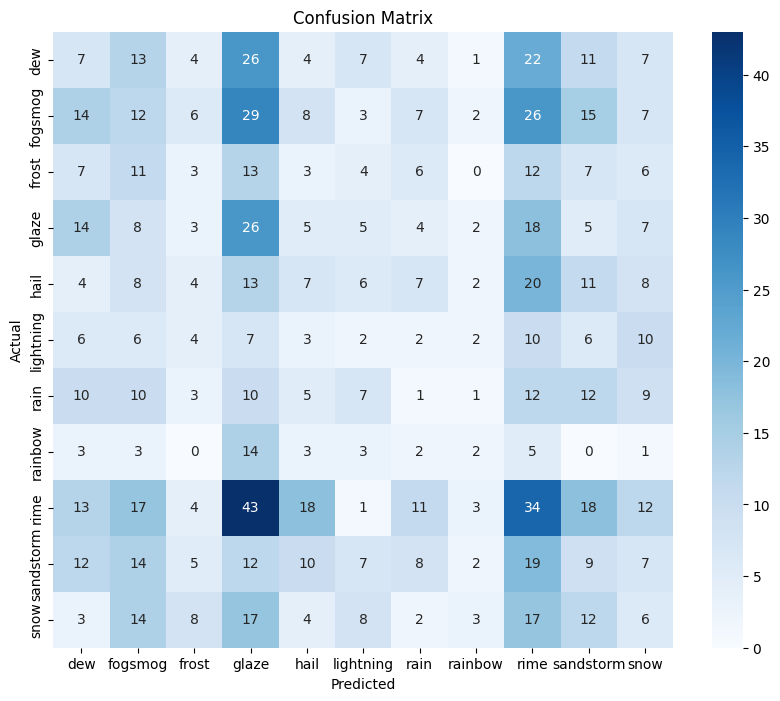

In [ ]:
# plot confusion matrix

plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_labels,
            yticklabels=class_labels)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

33/33 ━━━━━━━━━━━━━━━━━━━━ 35s 994ms/step


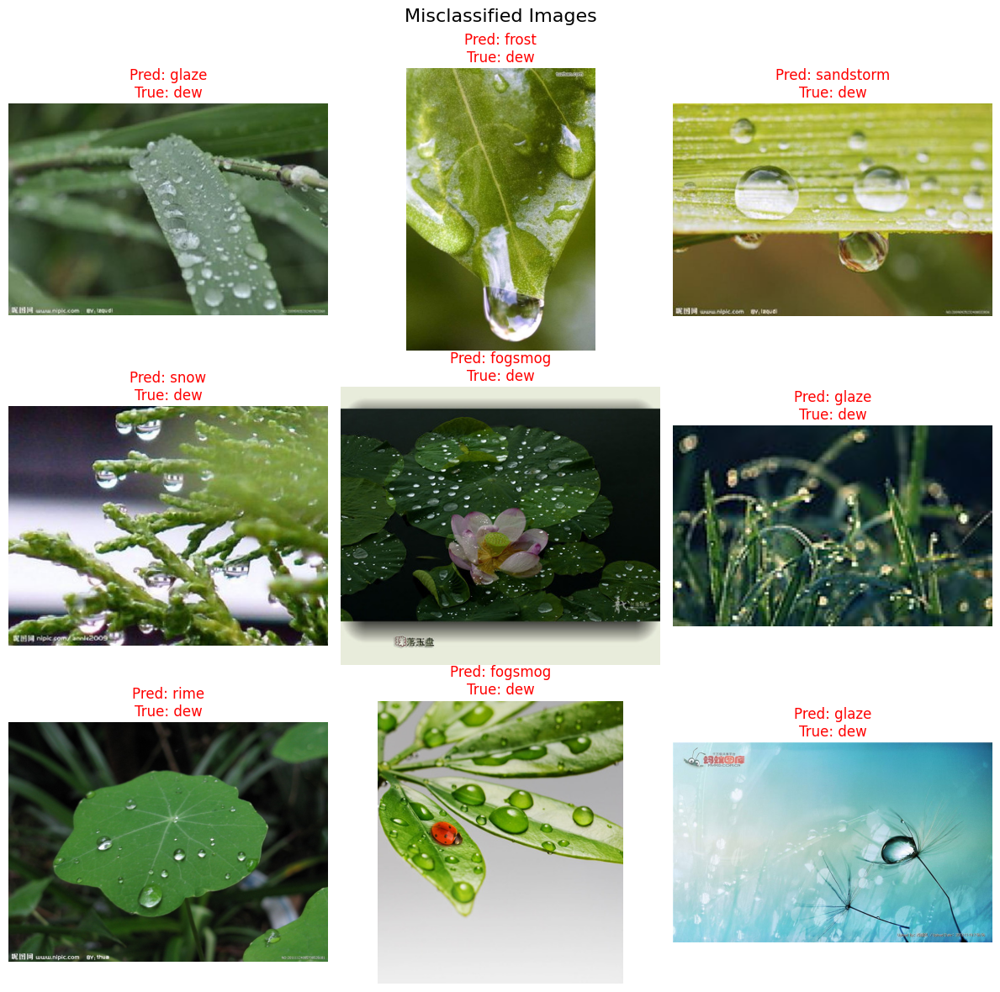

In [ ]:
# Predict on test set
y_pred_probs = model.predict(test_generator)
y_pred = np.argmax(y_pred_probs, axis=1)
y_true = test_generator.classes
class_labels = list(test_generator.class_indices.keys())

# Get image file paths (optional)
image_paths = test_generator.filepaths

# Find misclassified indices
misclassified_idxs = np.where(y_pred != y_true)[0]

# Display a few misclassified images
plt.figure(figsize=(12, 12))
for i, idx in enumerate(misclassified_idxs[:9]):  # show up to 9 examples
    img = plt.imread(image_paths[idx])

    plt.subplot(3, 3, i + 1)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Pred: {class_labels[y_pred[idx]]}\nTrue: {class_labels[y_true[idx]]}",
              color='red')

plt.tight_layout()
plt.suptitle("Misclassified Images", fontsize=16)
plt.subplots_adjust(top=0.92)
plt.show()


## Section 5: Model Improvement

1.  Modify the model by adding Dropout layers or BatchNormalization.
2.  Retrain and compare results with the base model.
3.  Replace the CNN with a pretrained model (e.g., MobileNetV2 or VGG16 using transfer learning). Freeze base layers and fine-tune on your weather dataset.
4.  Evaluate the improved model.

In [ ]:
# improve model by applying dropouts and early stops

model = Sequential()

# 1st Conv + Pool
model.add(Conv2D(filters=32, kernel_size=(3, 3), activation='relu', input_shape=(224, 224, 3)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.5))


# 2nd Conv + Pool
model.add(Conv2D(filters=64, kernel_size=(3, 3), activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.5))


# Flatten + Dense
model.add(Flatten())
model.add(Dense(units=128, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.5))

# Output layer (11 classes)
model.add(Dense(units=11, activation='softmax'))

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_4 (Conv2D)               │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 222, 222, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 109, 109, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 186624)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 128)            │    23,888,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 11)             │         1,419 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,909,707 (91.21 MB)

 Trainable params: 23,909,259 (91.21 MB)

 Non-trainable params: 448 (1.75 KB)

In [ ]:
# Early stopping: stops training if val_loss doesn't improve for 10 epochs
early_stop = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True,
    verbose=1
)

# Model checkpoint: saves best model (lowest val_loss)
checkpoint = ModelCheckpoint(
    filepath='best_model.keras', # Saves in native Keras format
    monitor='val_loss',
    save_best_only=True,
    verbose=1
)


In [ ]:
# fit model on training dataset
history_mod = model.fit(
    train_generator,
    epochs=10,
    validation_data=val_generator,
    callbacks=[early_stop, checkpoint],
    verbose=2
)

Epoch 1/10

Epoch 1: val_loss improved from inf to 5.64315, saving model to best_model.keras
150/150 - 873s - 6s/step - accuracy: 0.4469 - loss: 1.8210 - val_accuracy: 0.1252 - val_loss: 5.6431
Epoch 2/10

Epoch 2: val_loss improved from 5.64315 to 4.59030, saving model to best_model.keras
150/150 - 890s - 6s/step - accuracy: 0.5105 - loss: 1.5144 - val_accuracy: 0.2886 - val_loss: 4.5903
Epoch 3/10

Epoch 3: val_loss improved from 4.59030 to 2.38489, saving model to best_model.keras
150/150 - 918s - 6s/step - accuracy: 0.5583 - loss: 1.3489 - val_accuracy: 0.3395 - val_loss: 2.3849
Epoch 4/10

Epoch 4: val_loss improved from 2.38489 to 1.52086, saving model to best_model.keras
150/150 - 898s - 6s/step - accuracy: 0.5895 - loss: 1.2372 - val_accuracy: 0.5323 - val_loss: 1.5209
Epoch 5/10

Epoch 5: val_loss improved from 1.52086 to 1.47394, saving model to best_model.keras
150/150 - 878s - 6s/step - accuracy: 0.5726 - loss: 1.2658 - val_accuracy: 0.5636 - val_loss: 1.4739
Epoch 6/10

Ep

In [ ]:
# save model
model.save('/content/drive/MyDrive/DATA SETS/Models/2nd_weather_model.keras')

In [ ]:
# load model
updated_model = load_model('/content/drive/MyDrive/DATA SETS/Models/2nd_weather_model.keras')

In [ ]:
# Use pre buid MobileNetV2 and train it on our dataset

base_model = MobileNetV2(
    weights='imagenet',
    include_top=False, # exclude top layer
    input_shape=(224, 224, 3)
)

base_model.trainable = False # freeze convolutional layers

# build custom layers on top of it
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(128, activation='relu')(x)
x = Dropout(0.3)(x)
predictions = Dense(11, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)

In [ ]:
model.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [ ]:
# fit model
history_tl = model.fit(
    train_generator,
    epochs=10,
    validation_data=val_generator,
    callbacks=[early_stop, checkpoint],
    verbose=2
)

Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()



Epoch 1: val_loss improved from inf to 1.22819, saving model to best_model.keras
150/150 - 838s - 6s/step - accuracy: 0.3719 - loss: 1.8771 - val_accuracy: 0.6341 - val_loss: 1.2282
Epoch 2/10

Epoch 2: val_loss improved from 1.22819 to 0.89348, saving model to best_model.keras
150/150 - 125s - 833ms/step - accuracy: 0.6095 - loss: 1.1475 - val_accuracy: 0.7153 - val_loss: 0.8935
Epoch 3/10

Epoch 3: val_loss improved from 0.89348 to 0.77706, saving model to best_model.keras
150/150 - 95s - 637ms/step - accuracy: 0.6838 - loss: 0.9289 - val_accuracy: 0.7485 - val_loss: 0.7771
Epoch 4/10

Epoch 4: val_loss improved from 0.77706 to 0.70314, saving model to best_model.keras
150/150 - 98s - 655ms/step - accuracy: 0.7257 - loss: 0.8128 - val_accuracy: 0.7554 - val_loss: 0.7031
Epoch 5/10

Epoch 5: val_loss improved from 0.70314 to 0.66548, saving model to best_model.keras
150/150 - 94s - 626ms/step - accuracy: 0.7390 - loss: 0.7623 - val_accuracy: 0.7622 - val_loss: 0.6655
Epoch 6/10

Epoc

In [ ]:
# save model
model.save('/content/drive/MyDrive/DATA SETS/Models/transfer_model.keras')

In [ ]:
# load model
transfer_model = load_model('/content/drive/MyDrive/DATA SETS/Models/transfer_model.keras')

In [ ]:
# try model on test dataset

y_pred_probs = transfer_model.predict(test_generator)
y_pred = np.argmax(y_pred_probs, axis=1)
y_true = test_generator.classes
class_labels = list(test_generator.class_indices.keys())

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


33/33 ━━━━━━━━━━━━━━━━━━━━ 428s 13s/step


In [ ]:
accuracy = accuracy_score(y_true, y_pred)
print(f"Test Accuracy: {accuracy:.4f}")

Test Accuracy: 0.0961


In [ ]:
# display classification scores
print("\nClassification Report:")
print(classification_report(y_true, y_pred, target_names=class_labels))


Classification Report:
              precision    recall  f1-score   support

         dew       0.06      0.07      0.07       106
     fogsmog       0.13      0.14      0.13       129
       frost       0.07      0.08      0.07        72
       glaze       0.10      0.07      0.08        97
        hail       0.05      0.04      0.05        90
   lightning       0.05      0.05      0.05        58
        rain       0.03      0.04      0.04        80
     rainbow       0.06      0.06      0.06        36
        rime       0.18      0.21      0.20       174
   sandstorm       0.08      0.07      0.07       105
        snow       0.09      0.06      0.07        94

    accuracy                           0.10      1041
   macro avg       0.08      0.08      0.08      1041
weighted avg       0.09      0.10      0.09      1041



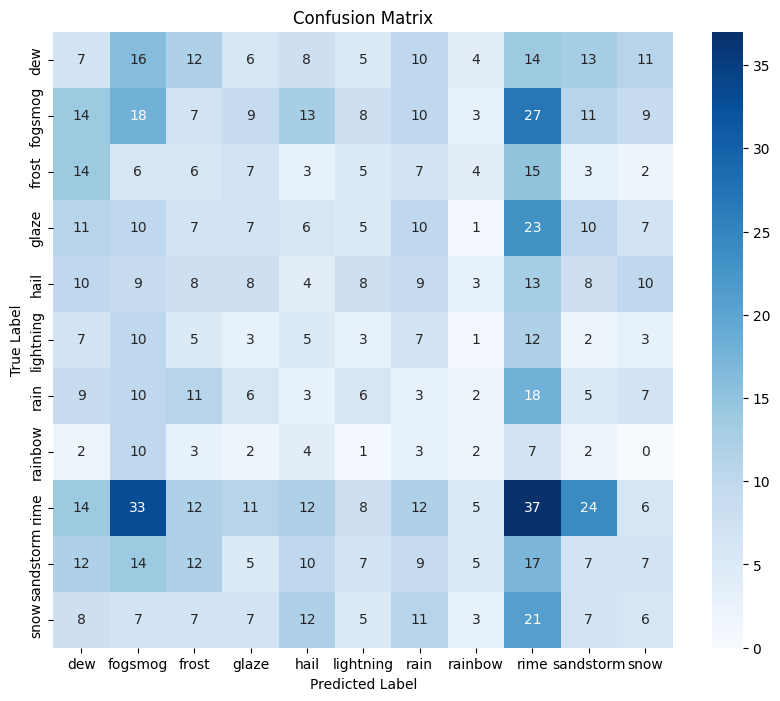

In [ ]:
# display confusion metrix
cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_labels,
            yticklabels=class_labels)
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

In [ ]:
print("================ The END ==================")

================ The END ==================
